## Import packages

In [14]:
import os
import sys

import torch
import torch.nn as nn   
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import pickle
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

import model.gmm_transformer as gmm_model
import asset.dataloader as dl
import asset.em_pytorch as ep
import asset.random_sampler as rs
import asset.gmm_train_tool as gtt
import asset.plot_eva as pe
import times_net_new.timesnet_model as timesnet_model
from times_net_new.timesnet_config import TimesBlockConfig
import asset.timesnet_loader as timesloader


## Define neccessary function for evaluation

In [15]:
def load_model(
    n_components = 6,
    hidden_d = 24 * 4,
    out_d = 24,
    n_heads = 4,
    mlp_ratio = 8,
    n_blocks = 6,
    encoder_path = r'mmd_vit_exp_30\model\_encoder_25_4537398.pth',
    path_para = r'mmd_vit_exp_30\model\_embedding_25_4537398.pth',
    path_token = r'mmd_vit_exp_30\model\_emb_empty_token_25_4537398.pth',
    random_sample_num = None
    ):

    chw = (1, random_sample_num,  25)
    
    # Set device to GPU if available, otherwise use CPU
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Initialize the transformer model
    encoder = gmm_model.ViT_encodernopara(chw, hidden_d, out_d, n_heads, mlp_ratio, n_blocks).to(device)
    _model_scale = sum(p.numel() for p in encoder.parameters() if p.requires_grad)
    print('Number of parameters of encoder:', _model_scale)

    # Load the pre-trained model state
    encoder.load_state_dict(torch.load(encoder_path, map_location=device))

    state_dict_para = torch.load(path_para, map_location=device)
    state_dict_token = torch.load(path_token, map_location=device)
    
    return encoder, state_dict_para, state_dict_token

def load_valdata(
    batch_size = 10,
    split_ratio = (0.8,0.1,0.1),
    data_path = r'data_process_for_data_collection_all\all_data_aug.pkl'):
    dataloader = dl.Dataloader_nolabel(data_path, batch_size, split_ratio)
    return dataloader

def inference(encoder, para_emb, token_emb, _val_data, sample_num, n_components=6, device='cpu'):
    encoder.eval()
    # _val_data = dataloader.load_vali_data(size=1)
    _val_data = torch.tensor(_val_data, dtype=torch.float64).to(device)
    
    # Normalize the input data
    _val_min,_ = _val_data[:,:, :-1].min(axis=1, keepdim=True)
    _val_max,_ = _val_data[:,:, :-1].max(axis=1, keepdim=True)
    _val_data[:,:, :-1] = (_val_data[:,:, :-1] - _val_min)/(_val_max-_val_min+1e-15)
    _val_sample_part = rs.random_sample(_val_data, 'random', sample_num)
    _val_sample_part[:, :, -1] = _val_sample_part[:, :, -1]/365 # simple date embedding
    
    # Padding the empty token to _train_sample_part to have shape (b, random_sample_num, 25)
    _val_sample_part_emb = gtt.pad_and_embed(_val_sample_part, 25, sample_num, token_emb, device)
    
    # use ep to do one iteration of the EM algorithm
    _ms, _covs = ep.GMM_PyTorch_Batch(n_components, 24).fit(_val_sample_part[:,:, :-1], 1)
    
    # Concatenate the mean and variance to have (b, n_components*2, 25)
    _param_emb, _param = gtt.concatenate_and_embed_params(_ms, _covs, n_components, para_emb, device)
    
    # Feed into the encoder
    _val_sample_part_emb = torch.cat((_param_emb, _val_sample_part_emb), dim=1)
    encoder_out = encoder(_val_sample_part_emb)
    
    _new_para = encoder_out[:, :n_components*2, :]
    _new_para = encoder.output_adding_layer(_new_para, _param)
        
    return _new_para, _param, _val_data[:, :, :-1], _val_sample_part[:, :, :-1], (_val_min, _val_max)

def sample_and_scale(
    _new_para = None,
    _mm = None,
    _val_data = None,
    _val_sample_part = None,
    sample_amount = 250,
    n_components = 6,
    ):
    _min = _mm[0].cpu().detach().numpy()
    _max = _mm[1].cpu().detach().numpy()
    _samples, _gmm = pe.sample_from_gmm(n_components=n_components , _new_para=_new_para, _num=0, _num_samples=sample_amount)
    t_samples = _samples * (_max - _min) + _min
    t_samples[t_samples < 0] = 0
    r_samples_scale_back =_val_data * (_max - _min) + _min
    r_samples_part_scale_back = _val_sample_part * (_max - _min) + _min
    return t_samples[0], r_samples_scale_back[0], r_samples_part_scale_back[0]

def normalize_and_mask_val(data, index_mask, num_ones_to_keep, device='cpu'):
    # data = data.view(data.size(0), -1, 1)
    
    # Normalize the data between 0 and 1 for each sample in the batch
    _min = data.min(dim=1).values
    _max = data.max(dim=1).values
    _min = _min.unsqueeze(1)
    _max = _max.unsqueeze(1)
    data = (data - _min) / (_max - _min + 1e-10)
    
    data = data.to(device)

    # Find rows with at least one '1'
    tensor = (index_mask.sum(dim=2) >= 24).float()
    
    # Convert to numpy array
    np_array = tensor.numpy()

    # Get the indices of ones in the array
    indices = np.argwhere(np_array == 1)

    # Create an array to hold the output
    output_array = np.zeros_like(np_array)

    # Sort indices by row, then shuffle within rows to randomize which ones are kept
    np.random.shuffle(indices)

    # Keep track of how many ones have been placed in each row
    placed_ones = np.zeros(np_array.shape[0], dtype=int)

    # Place ones in the output array
    for i in range(indices.shape[0]):
        row, col = indices[i]
        if placed_ones[row] < num_ones_to_keep:
            output_array[row, col] = 1
            placed_ones[row] += 1

    # Convert back to tensor
    modified_tensor = torch.tensor(output_array)
    random_mask = modified_tensor.unsqueeze(-1).repeat(1, 1, 24)

    return data, random_mask.to(device), (_min, _max)

def timesnet_eva(model, val_data, sample_num):
    full_series, index_mask = timesloader.out_full_matrix(val_data)
    val_data_timesnet, random_mask, scaler = normalize_and_mask_val(full_series, index_mask, sample_num)
    pre_val_data = model(val_data_timesnet.double(), None, random_mask.double())
    mask = (index_mask != 0).all(dim=2)
    expanded_mask = mask.unsqueeze(-1).expand_as(index_mask)
    filtered_tensor = pre_val_data[expanded_mask].view(pre_val_data.size(0), -1, pre_val_data.size(2))
    
    # Scale back the data
    filtered_tensor = filtered_tensor * (scaler[1] - scaler[0]) + scaler[0]
    filtered_tensor[filtered_tensor < 0] = 0
    return filtered_tensor # +0.001*torch.randn_like(filtered_tensor)

def timesnet_eva_mmd(model, val_data, sample_num):
    full_series, index_mask = timesloader.out_full_matrix(val_data)
    val_data_timesnet, random_mask, scaler = normalize_and_mask_val(full_series, index_mask, sample_num)
    pre_val_data = model(val_data_timesnet.double(), None, random_mask.double())
    filtered_tensor = rs.random_sample(pre_val_data, 'random', 250)
    
    # Scale back the data
    filtered_tensor = filtered_tensor * (scaler[1] - scaler[0]) + scaler[0]
    filtered_tensor[filtered_tensor < 0] = 0
    return filtered_tensor # +0.001*torch.randn_like(filtered_tensor)

def load_timesnet_model(
    timesnet_path = r'times_net_new\timesnet_4599768.pth'
    ):
    configs = TimesBlockConfig()
    model = timesnet_model.Model(configs)
    model.load_state_dict(torch.load(timesnet_path, map_location=torch.device('cpu')))
    return model
 
def plot_mmd_comparison(mmd_rr_part_collection, mmd_rt_collection, mmd_rtimesnet_collection, mmd_rtimesnet_mmd_collection):
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Main plot
    ax.plot(range(1, len(mmd_rr_part_collection) + 1), mmd_rr_part_collection, label='Sampled ECP Data', linewidth=2, marker='o')
    ax.plot(range(1, len(mmd_rt_collection) + 1), mmd_rt_collection, label='Our Method', linewidth=2, marker='s')
    ax.plot(range(1, len(mmd_rtimesnet_collection) + 1), mmd_rtimesnet_collection, label='TimesNet_MSE', linewidth=2, marker='d')
    ax.plot(range(1, len(mmd_rtimesnet_mmd_collection) + 1), mmd_rtimesnet_mmd_collection, label='TimesNet_MMD', linewidth=2, marker='x')
    
    ax.set_xlabel('Number of Shot [-]', fontsize=25)
    ax.set_ylabel('Maximum Mean Discrepancy [-]', fontsize=25)
    ax.set_title('MMD Comparison Results', fontsize=25)
    xticks = [1] + list(range(5, len(mmd_rr_part_collection), 5)) + [len(mmd_rr_part_collection)]
    ax.set_xticks(xticks)
    ax.tick_params(axis='both', which='major', labelsize=20)
    ax.grid(True)
    ax.set_xlim(0.5, len(mmd_rr_part_collection) + 0.5)
    
    # Move the legend to the left
    ax.legend(fontsize=20, loc='upper left', bbox_to_anchor=(0, 1))

    # Inset plot on the top right with transparency
    inset_ax = inset_axes(ax, width="30%", height="30%", loc='upper right', bbox_to_anchor=(-0.1, -0.4, 1, 1), bbox_transform=ax.transAxes, borderpad=0)
    inset_ax.plot(range(1, len(mmd_rr_part_collection) + 1), mmd_rr_part_collection, linewidth=2, marker='o')
    inset_ax.plot(range(1, len(mmd_rt_collection) + 1), mmd_rt_collection, linewidth=2, marker='s')
    inset_ax.plot(range(1, len(mmd_rtimesnet_collection) + 1), mmd_rtimesnet_collection, linewidth=2, marker='d')
    inset_ax.plot(range(1, len(mmd_rtimesnet_mmd_collection) + 1), mmd_rtimesnet_mmd_collection, linewidth=2, marker='x')

    inset_ax.set_xlim(0.5, len(mmd_rr_part_collection) + 0.5)
    inset_ax.set_ylim(0, 0.1)
    # inset_ax.grid(True)
    inset_ax.set_xticks(xticks)
    inset_ax.tick_params(axis='both', which='major', labelsize=20)
    inset_ax.patch.set_alpha(0.7)  # Set transparency

    # Dashed line linking the inset
    mark_inset(ax, inset_ax, loc1=1, loc2=2, fc="none", ec="0.3", ls="--", lw=2, clip_on=True)

    plt.show()

def plot_colored_curves(ax, data, title, total_consumption, color_map, norm, y_min, y_max, alpha=0.2, tick_fontsize=20, display_title=True, title_fontsize=30):
    for i in range(data.shape[0]):
        color = color_map(norm(total_consumption[i]))
        ax.plot(data[i], c=color, alpha=alpha)
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    if display_title:
        ax.set_title(title, fontsize=title_fontsize)
    ax.set_ylim(y_min, y_max)
    ax.set_xlim(0, 23)  # Ensure x-axis ranges from 0 to 23
    ax.tick_params(axis='both', which='major', labelsize=tick_fontsize)  # Set tick font size

    hours = [f'{h:02d}:00' for h in range(0, 24, 4)]
    ax.set_xticks(np.arange(0, 24, 4))
    ax.set_xticklabels(hours, fontsize=tick_fontsize)
    # Rotate the x-axis labels for better readability
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')

def create_plots(t_samples_list, r_samples_list, r_samples_part_list, timesnet_sample_list, timesnet_sample_mmd_list, label_fontsize=28, tick_fontsize=20):
    # Determine the number of rows based on the number of sample sets
    num_rows = len(t_samples_list)

    # Set up the subplots grid with num_rows and 4 columns
    fig, axs = plt.subplots(num_rows, 5, figsize=(20, num_rows * 3), sharex=True, sharey=False)

    # Iterate over each set of samples
    for row in range(num_rows):
        r_samples = r_samples_list[row]
        r_samples_part = r_samples_part_list[row]
        t_samples = t_samples_list[row]
        timesnet_sample = timesnet_sample_list[row]
        timesnet_sample_mmd = timesnet_sample_mmd_list[row]

        # Calculate the total daily consumption for this row
        total_consumption = r_samples.sum(axis=1)
        color_map = plt.cm.coolwarm  # Choose a color map that transitions from red to blue
        norm = plt.Normalize(total_consumption.min(), total_consumption.max())

        # Get the y-axis limits for this row based on the Complete ECP Data
        y_min, y_max = r_samples.min(), r_samples.max()

        # Only the first row has titles for each plot with increased font size
        display_title = row == 0
        title_fontsize = label_fontsize if display_title else 0  # Increase font size for the first row titles

        # Define titles only for the first row
        titles = ['Complete ECP Data', 'Sampled Data', 'Our Method', 'TimesNet MSE', 'TimesNet MMD']

        plot_colored_curves(axs[row, 0], r_samples, titles[0], total_consumption, color_map, norm, y_min, y_max, 0.2, tick_fontsize, display_title, title_fontsize)
        plot_colored_curves(axs[row, 1], r_samples_part, titles[1], total_consumption, color_map, norm, y_min, y_max, 0.5, tick_fontsize, display_title, title_fontsize)
        plot_colored_curves(axs[row, 2], t_samples, titles[2], total_consumption, color_map, norm, y_min, y_max, 0.2, tick_fontsize, display_title, title_fontsize)
        plot_colored_curves(axs[row, 3], timesnet_sample[0].detach().numpy(), titles[3], total_consumption, color_map, norm, y_min, y_max, 0.2, tick_fontsize, display_title, title_fontsize)
        plot_colored_curves(axs[row, 4], timesnet_sample_mmd[0].detach().numpy(), titles[4], total_consumption, color_map, norm, y_min, y_max, 0.2, tick_fontsize, display_title, title_fontsize)

        # Add a color bar next to the last plot in this row
        divider = make_axes_locatable(axs[row, 4])
        cax = divider.append_axes("right", size="5%", pad=0.15)
        sm = plt.cm.ScalarMappable(cmap=color_map, norm=norm)
        sm.set_array([])
        cbar = plt.colorbar(sm, cax=cax)
        cbar.ax.tick_params(labelsize=tick_fontsize)  # Set the fontsize here

    # Add a single x and y label for the whole figure
    fig.text(0.5, -0.01, 'Hour of Day [-]', ha='center', fontsize=label_fontsize)
    fig.text(-0.015, 0.5, 'Electricity Consumption [kWh]', va='center', rotation='vertical', fontsize=label_fontsize)

    # Add a single color bar label in the middle of the last column
    fig.text(0.90, 0.5, 'Daily Total Consumption [kWh]', va='center', rotation='vertical', fontsize=label_fontsize)

    plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to accommodate the color bar
    plt.show()

def few_shot_eva(encoder, timesnet_model, timesnet_model_mmd, _para, _token, val_data, min_shot=1, max_shot=25, _iter=10):
    # mmd
    mmd_rr_part_collection = []
    mmd_rt_collection = []
    mmd_rtimesnet_collection = []
    mmd_rtimesnet_mmd_collection = []
    
    # kl
    kl_rr_part_collection = []
    kl_rt_collection = []
    kl_rtimesnet_collection = []
    kl_rtimesnet_mmd_collection = []
    
    # ks 
    ks_rr_part_collection = []
    ks_rt_collection = []
    ks_rtimesnet_collection = []
    ks_rtimesnet_mmd_collection = []
    
    # wd
    wd_rr_part_collection = []
    wd_rt_collection = []
    wd_rtimesnet_collection = []
    wd_rtimesnet_mmd_collection = []
    
    # mse m 
    mse_rr_part_collection = []
    mse_rt_collection = []
    mse_rtimesnet_collection = []
    mse_rtimesnet_mmd_collection = []
    
    
    shot_list = [100]
    
    for sample_num in range(min_shot, max_shot): # 25
        # mmd
        mmd_tr = 0
        mmd_tr_part_r = 0
        mmd_rtimesnet = 0
        mmd_rtimesnet_mmd = 0
        
        # kl
        kl_tr = 0
        kl_tr_part_r = 0
        kl_rtimesnet = 0
        kl_rtimesnet_mmd = 0
        
        # ks 
        ks_tr = 0
        ks_tr_part_r = 0
        ks_rtimesnet = 0
        ks_rtimesnet_mmd = 0
        
        # wd
        wd_tr = 0
        wd_tr_part_r = 0
        wd_rtimesnet = 0
        wd_rtimesnet_mmd = 0
        
        # mse m
        mse_tr = 0
        mse_tr_part_r = 0
        mse_rtimesnet = 0
        mse_rtimesnet_mmd = 0
        
        print(f'Number of shots: {sample_num}')
        
        for _ in tqdm(range(_iter)): # 500
            _new_para, _param, _val_data, _val_sample_part, _mm = inference(encoder, _para, _token, val_data, sample_num)
            t_samples, r_samples, r_samples_part = sample_and_scale(_new_para, _mm, _val_data, _val_sample_part, 250) # 250
            timesnet_sample = timesnet_eva(timesnet_model, val_data, sample_num)
            timesnet_sample_mmd = timesnet_eva_mmd(timesnet_model_mmd,
                                                   val_data, sample_num)
            
            # mmd calculation
            mmd_tr += pe.compute_mmd(t_samples, r_samples)
            mmd_tr_part_r += pe.compute_mmd(r_samples, r_samples_part)
            mmd_rtimesnet += pe.compute_mmd(r_samples, timesnet_sample[0].detach().numpy())
            mmd_rtimesnet_mmd += pe.compute_mmd(r_samples, timesnet_sample_mmd[0].detach().numpy())
            
            
            if sample_num in shot_list: # [4, 8, 16, 24]:
                kl_tr += pe.compute_kl_divergence(t_samples, r_samples)
                kl_tr_part_r += pe.compute_kl_divergence(r_samples, r_samples_part)
                kl_rtimesnet += pe.compute_kl_divergence(r_samples, timesnet_sample[0].detach().numpy())
                kl_rtimesnet_mmd += pe.compute_kl_divergence(r_samples, timesnet_sample_mmd[0].detach().numpy())
                
                ks_tr += pe.compute_ks_distance(t_samples, r_samples)
                ks_tr_part_r += pe.compute_ks_distance(r_samples, r_samples_part)
                ks_rtimesnet += pe.compute_ks_distance(r_samples, timesnet_sample[0].detach().numpy())
                ks_rtimesnet_mmd += pe.compute_ks_distance(r_samples, timesnet_sample_mmd[0].detach().numpy())
                
                wd_tr += pe.compute_wasserstein_distance(t_samples, r_samples)
                wd_tr_part_r += pe.compute_wasserstein_distance(r_samples, r_samples_part)
                wd_rtimesnet += pe.compute_wasserstein_distance(r_samples, timesnet_sample[0].detach().numpy())
                wd_rtimesnet_mmd += pe.compute_wasserstein_distance(r_samples, timesnet_sample_mmd[0].detach().numpy())
                
                mse_tr += pe.compute_mse_mean(t_samples, r_samples.detach().numpy())
                mse_tr_part_r += pe.compute_mse_mean(r_samples.detach().numpy(), r_samples_part.detach().numpy())
                mse_rtimesnet += pe.compute_mse_mean(r_samples.detach().numpy(), timesnet_sample[0].detach().numpy())
                mse_rtimesnet_mmd += pe.compute_mse_mean(r_samples.detach().numpy(), timesnet_sample_mmd[0].detach().numpy())
                
        # mmd
        mmd_rr_part_collection.append(mmd_tr_part_r/_iter)
        mmd_rt_collection.append(mmd_tr/_iter)
        mmd_rtimesnet_collection.append(mmd_rtimesnet/_iter)
        mmd_rtimesnet_mmd_collection.append(mmd_rtimesnet_mmd/_iter)
        
        mmd = (mmd_rr_part_collection, mmd_rt_collection, mmd_rtimesnet_collection, mmd_rtimesnet_mmd_collection)
        
        if sample_num in shot_list: 
            # kl
            kl_rr_part_collection.append(kl_tr_part_r/_iter)
            kl_rt_collection.append(kl_tr/_iter)
            kl_rtimesnet_collection.append(kl_rtimesnet/_iter)
            kl_rtimesnet_mmd_collection.append(kl_rtimesnet_mmd/_iter)
            kl = (kl_rr_part_collection, kl_rt_collection, kl_rtimesnet_collection, kl_rtimesnet_mmd_collection)
               
            # ks
            ks_rr_part_collection.append(ks_tr_part_r/_iter)
            ks_rt_collection.append(ks_tr/_iter)
            ks_rtimesnet_collection.append(ks_rtimesnet/_iter)
            ks_rtimesnet_mmd_collection.append(ks_rtimesnet_mmd/_iter)
            ks = (ks_rr_part_collection, ks_rt_collection, ks_rtimesnet_collection, ks_rtimesnet_mmd_collection)
            
            # wd 
            wd_rr_part_collection.append(wd_tr_part_r/_iter)
            wd_rt_collection.append(wd_tr/_iter)
            wd_rtimesnet_collection.append(wd_rtimesnet/_iter)
            wd_rtimesnet_mmd_collection.append(wd_rtimesnet_mmd/_iter)
            wd = (wd_rr_part_collection, wd_rt_collection, wd_rtimesnet_collection, wd_rtimesnet_mmd_collection)
            
            # mse
            mse_rr_part_collection.append(mse_tr_part_r/_iter)
            mse_rt_collection.append(mse_tr/_iter)
            mse_rtimesnet_collection.append(mse_rtimesnet/_iter)
            mse_rtimesnet_mmd_collection.append(mse_rtimesnet_mmd/_iter)
            mse = (mse_rr_part_collection, mse_rt_collection, mse_rtimesnet_collection, mse_rtimesnet_mmd_collection)
            
    return mmd, (t_samples, r_samples, r_samples_part, timesnet_sample, timesnet_sample_mmd) #, (kl, ks, wd, mse)
    
    

# Plot the evaluation results

Number of parameters of encoder: 4537398
Number of shots: 4


100%|██████████| 1/1 [00:01<00:00,  1.98s/it]


Number of shots: 4


100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


Number of shots: 4


100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


Number of shots: 4


100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


Number of shots: 4


100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


Number of shots: 4


100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


Number of shots: 4


100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


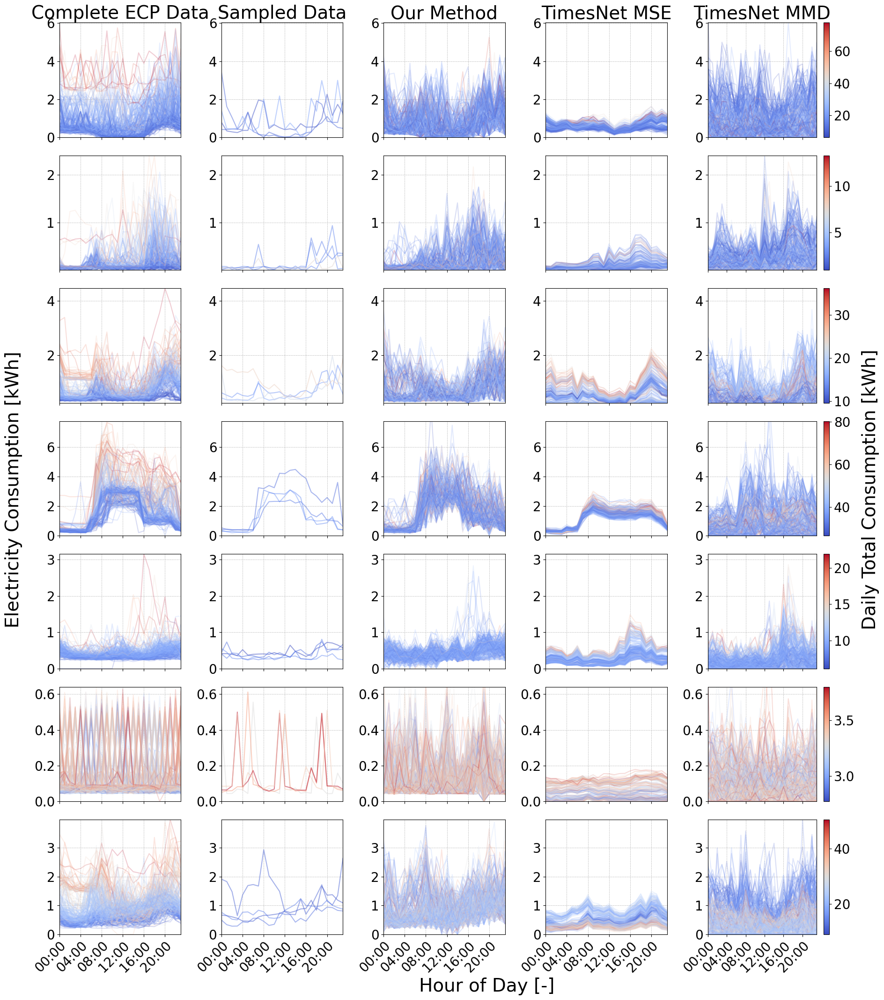

Number of shots: 8


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


Number of shots: 8


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


Number of shots: 8


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


Number of shots: 8


100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


Number of shots: 8


100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


Number of shots: 8


100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


Number of shots: 8


100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


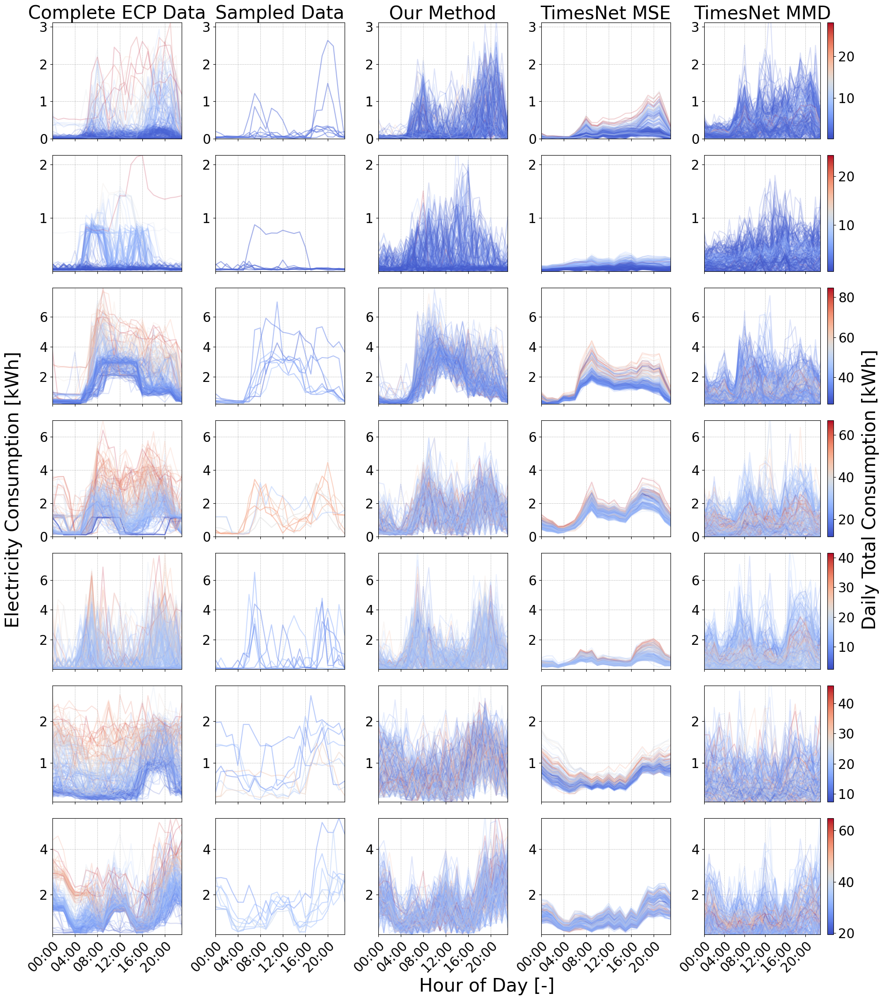

Number of shots: 16


100%|██████████| 1/1 [00:01<00:00,  1.95s/it]


Number of shots: 16


100%|██████████| 1/1 [00:01<00:00,  1.90s/it]


Number of shots: 16


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


Number of shots: 16


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


Number of shots: 16


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


Number of shots: 16


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


Number of shots: 16


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


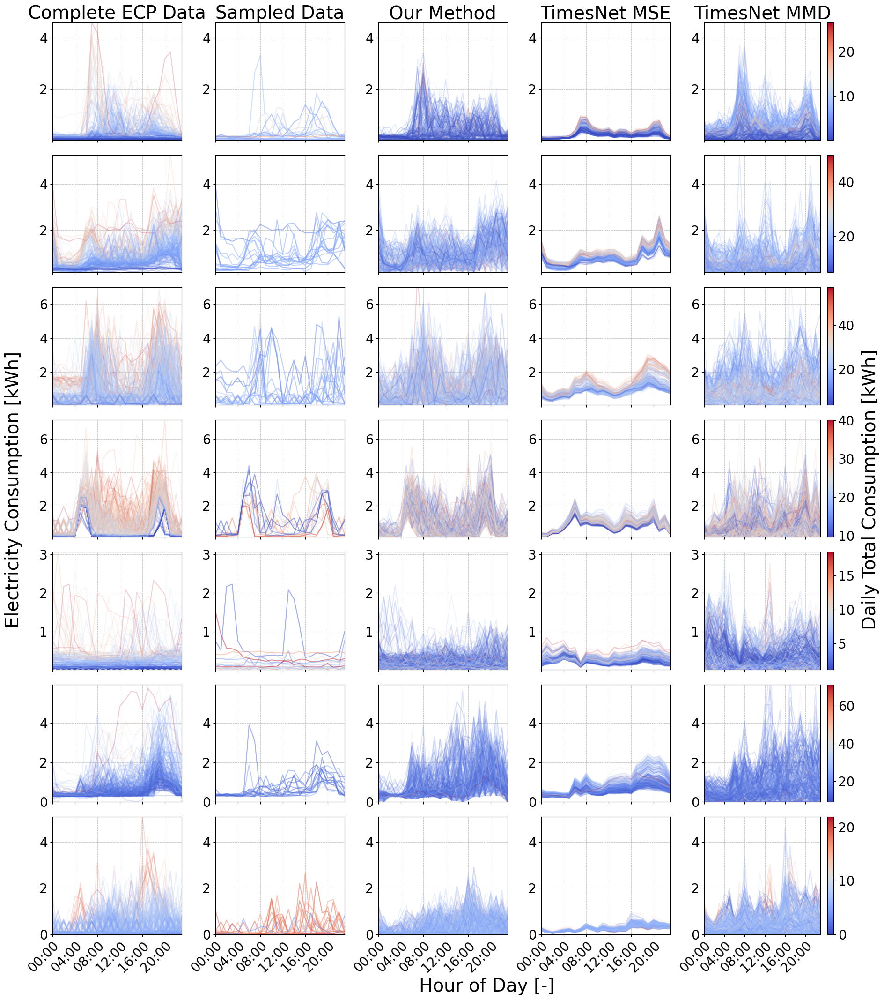

Number of shots: 24


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


Number of shots: 24


100%|██████████| 1/1 [00:03<00:00,  3.59s/it]


Number of shots: 24


100%|██████████| 1/1 [00:02<00:00,  2.84s/it]


Number of shots: 24


100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


Number of shots: 24


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


Number of shots: 24


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


Number of shots: 24


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


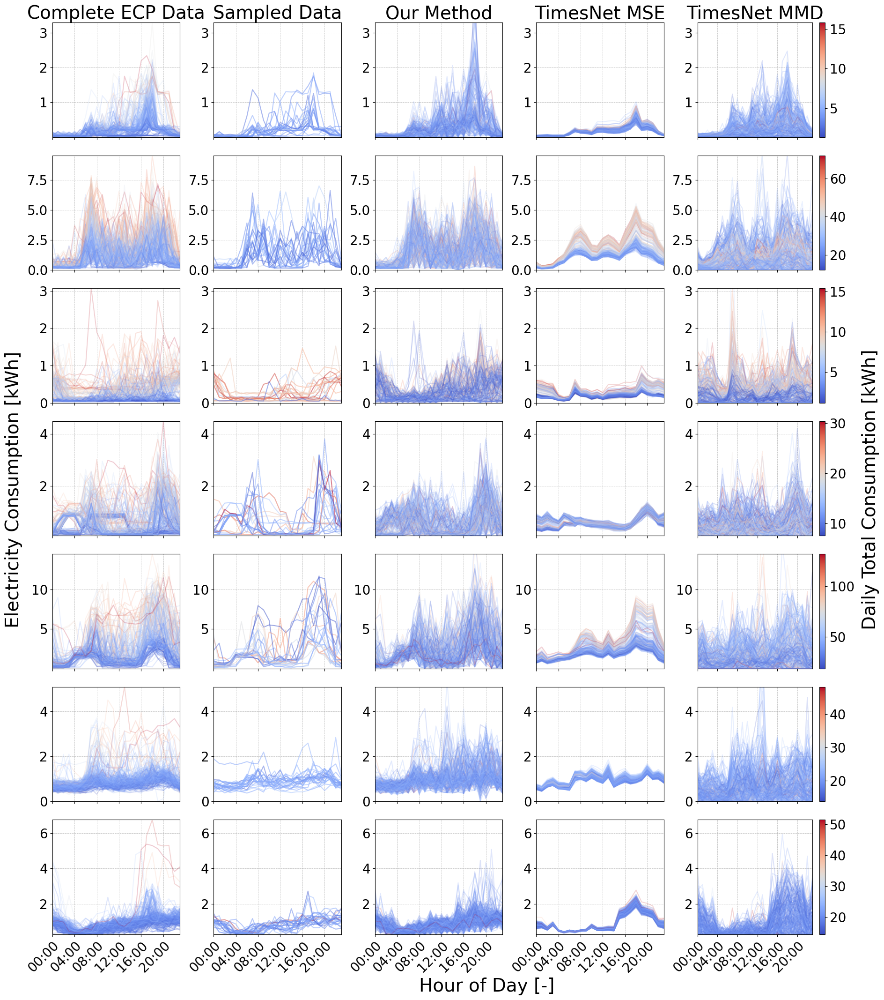

Number of shots: 1


100%|██████████| 10/10 [00:20<00:00,  2.07s/it]


Number of shots: 2


100%|██████████| 10/10 [00:19<00:00,  1.91s/it]


Number of shots: 3


100%|██████████| 10/10 [00:19<00:00,  1.96s/it]


Number of shots: 4


100%|██████████| 10/10 [00:20<00:00,  2.07s/it]


Number of shots: 5


100%|██████████| 10/10 [00:25<00:00,  2.58s/it]


Number of shots: 6


100%|██████████| 10/10 [00:21<00:00,  2.17s/it]


Number of shots: 7


100%|██████████| 10/10 [00:23<00:00,  2.35s/it]


Number of shots: 8


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


Number of shots: 9


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


Number of shots: 10


100%|██████████| 10/10 [00:21<00:00,  2.11s/it]


Number of shots: 11


100%|██████████| 10/10 [00:22<00:00,  2.22s/it]


Number of shots: 12


100%|██████████| 10/10 [00:20<00:00,  2.08s/it]


Number of shots: 13


100%|██████████| 10/10 [00:21<00:00,  2.13s/it]


Number of shots: 14


100%|██████████| 10/10 [00:20<00:00,  2.08s/it]


Number of shots: 15


100%|██████████| 10/10 [00:20<00:00,  2.09s/it]


Number of shots: 16


100%|██████████| 10/10 [00:21<00:00,  2.15s/it]


Number of shots: 17


100%|██████████| 10/10 [00:20<00:00,  2.07s/it]


Number of shots: 18


100%|██████████| 10/10 [00:22<00:00,  2.23s/it]


Number of shots: 19


100%|██████████| 10/10 [00:21<00:00,  2.15s/it]


Number of shots: 20


100%|██████████| 10/10 [00:20<00:00,  2.07s/it]


Number of shots: 21


100%|██████████| 10/10 [00:20<00:00,  2.06s/it]


Number of shots: 22


100%|██████████| 10/10 [00:21<00:00,  2.17s/it]


Number of shots: 23


100%|██████████| 10/10 [00:21<00:00,  2.11s/it]


Number of shots: 24


100%|██████████| 10/10 [00:21<00:00,  2.18s/it]


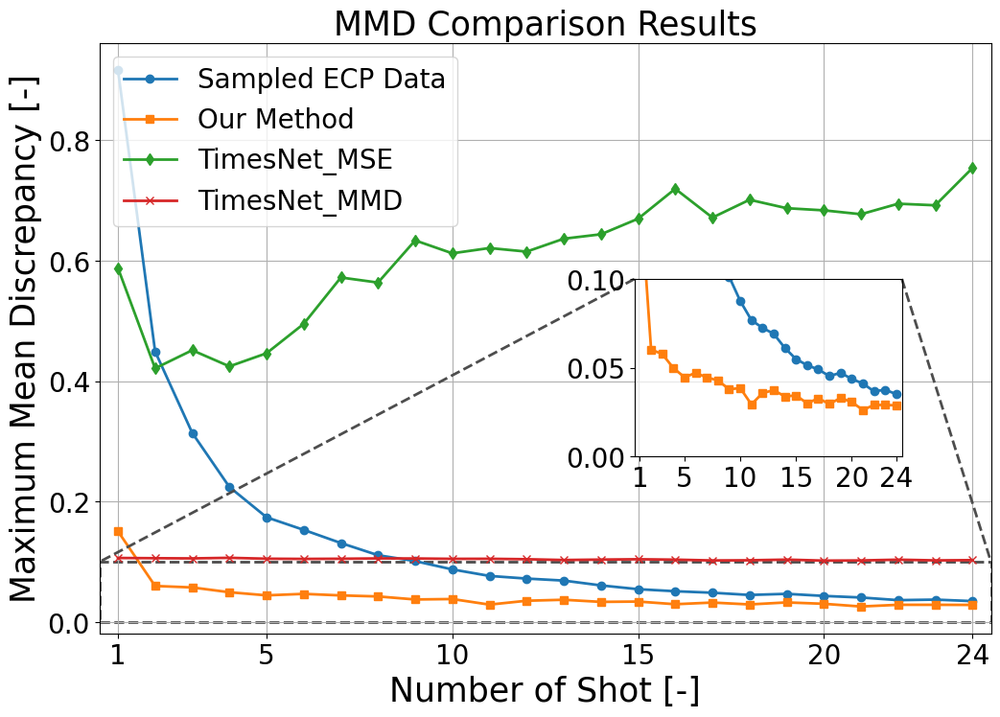

In [16]:
# ----------------------Load The Models----------------------
encoder, _para, _token = load_model()
dataloader = load_valdata()
timesnet_model_mse = load_timesnet_model()
timesnet_model_mmd = load_timesnet_model(r'times_net_new\timesnet_DDM_4599768.pth')
val_data = dataloader.load_val_data(size=1)

# ----------------------Load The Models----------------------

# -----------------------Plot the figure of ECP--------------------------------
for nums in [(4, 5), (8, 9), (16, 17), (24, 25)]:
    t_samples_list, r_samples_list, r_samples_part_list, timesnet_sample_list, timesnet_sample_mmd_list = [], [], [], [], []
    for _element in range(7): 
        val_data = dataloader.load_val_data(size=1)
        mmds,  _data = few_shot_eva(encoder, timesnet_model_mse, timesnet_model_mmd, _para, 
                                    _token, val_data, min_shot=nums[0], max_shot=nums[1], _iter=1)
        t_samples, r_samples, r_samples_part, timesnet_sample, timesnet_sample_mmd = _data
        t_samples_list.append(t_samples)
        r_samples_list.append(r_samples)
        r_samples_part_list.append(r_samples_part)
        timesnet_sample_list.append(timesnet_sample)
        timesnet_sample_mmd_list.append(timesnet_sample_mmd)
        
    create_plots(t_samples_list, r_samples_list, r_samples_part_list, timesnet_sample_list, timesnet_sample_mmd_list)
# -----------------------Plot the figure of ECP--------------------------------



# ----------------------Plot MMD figure---------------------------------------    
mmds,  _data = few_shot_eva(encoder, timesnet_model_mse, timesnet_model_mmd, _para, _token, val_data)    
plot_mmd_comparison(mmds[0], mmds[1], mmds[2], mmds[3])
# ----------------------Plot MMD figure---------------------------------------    
